## 학습 목표
- 딥러닝을 적용하여 핸드폰 인물 사진 모드를 따라 해 보자.

## 목차

- 들어가며
- 셸로우 포커스 만들기 (1) 사진을 준비하자
- 셸로우 포커스 만들기 (2) 세그멘테이션으로 사람 분리하기
- 셸로우 포커스 만들기 (3) 시맨틱 세그멘테이션 다뤄보기
- 셸로우 포커스 만들기 (4) 배경 흐리게 하기
- 셸로우 포커스 만들기 (5) 흐린 배경과 원본 영상 합성
- 프로젝트: 인물 모드 문제점 찾기
- 프로젝트 제출


---------------------------------------------

## 1. 사진 준비

In [4]:
! pip install pixellib

     |████████████████████████████████| 430 kB 27.5 MB/s eta 0:00:01
     |████████████████████████████████| 156 kB 75.5 MB/s eta 0:00:01
     |████████████████████████████████| 843 kB 67.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.9 MB 74.1 MB/s eta 0:00:01
     |████████████████████████████████| 55 kB 1.1 MB/s  eta 0:00:01
     |████████████████████████████████| 145 kB 73.1 MB/s eta 0:00:01
     |████████████████████████████████| 112 kB 81.0 MB/s eta 0:00:01
     |████████████████████████████████| 74 kB 704 kB/s  eta 0:00:01
     |████████████████████████████████| 78 kB 1.9 MB/s  eta 0:00:01
     |████████████████████████████████| 4.3 MB 69.5 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 75.9 MB/s eta 0:00:01
     |████████████████████████████████| 87 kB 1.6 MB/s  eta 0:00:01
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220119-py3-none-any.whl size=65259 sha256=11696c5564c213ff165b91b203a55a1ca6137d7df67a1d412cfc5cd526c9b871
  Stored in d

  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=41c9665b3cce76d8750cfe68cb7e67a8db720767a3134b73dba451d7e2c63fa2
  Stored in directory: /aiffel/.cache/pip/wheels/ca/33/b7/336836125fc9bb4ceaa4376d8abca10ca8bc84ddc824baea6c
  Created wheel for imantics: filename=imantics-0.1.12-py3-none-any.whl size=16033 sha256=a113799b86e4f20418a6a0b99406f019b7f071e0da1d4d8fee8ef36301fc3d6b
  Stored in directory: /aiffel/.cache/pip/wheels/da/7c/3e/296fe3ed4eb3bd713e91dee0d0549f12f316d49939a64bdc96
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115928 sha256=ac6c026252ab039d61ced755233a5cc6bbdd7b8c2e3d48c370007bd0345c97da
  Stored in directory: /aiffel/.cache/pip/wheels/8a/67/fb/2e8a12fa16661b9d5af1f654bd199366799740a85c64981226
Successfully built fvcore antlr4-python3-runtime imantics fire
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 3.7.4.3
    Uninstalling typin

In [5]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

print('슝=3')

슝=3


(1440, 1080, 3)


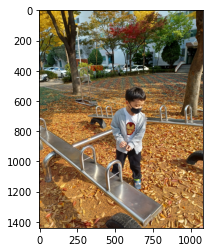

In [6]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

## 2. segmentation으로 사람 분리
- FCN, SegNet, U-Net 등 있지만, 오늘은 DeepLab 사용

In [8]:
# pixellib에서 제공하는 모델 다운로드
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f13146bcad0>)

> 다운로드한 모델을 이요해서 Pixellib으로 우리가 사용할 sementation 모델 생성

In [9]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

## 3. 세그멘테이션 다뤄보기

In [11]:
# 모델에 이미지 입력하기
segvalues, output = model.segmentAsPascalvoc(img_path)

> 세그멘테이션 모델로서 Pascal Voc 데이터로 학습된 모델을 사용한다는 의미  
> 모델마다 학습시킨 데이터가 다르고, 이에 따라 우리의 결과값이 달라지니 항상 확인할 것

In [17]:
segvalues

{'class_ids': array([ 0,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [18]:
segvalues['masks'].shape

(1440, 1080)

In [20]:
output

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [21]:
output.shape

(1440, 1080, 3)

In [34]:
np.unique(output, return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [22]:
# PASCAL VOC 데이터의 라벨 종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

> tv의 라벨은 20이 되는 셈

> 사람(라벨 15)만 추출해보고 싶은데 일단 output을 이미지로 확인하기

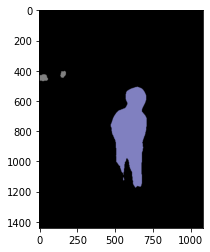

In [23]:
plt.imshow(output)
plt.show()

> 확인해보니 뭔가 segmentation된 물체들이 있다.  
> 이를 아까 segmentation 모델을 돌린 후 반환된 값들을 확인함으로써 파악해보자

In [24]:
segvalues

{'class_ids': array([ 0,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [30]:
np.unique(segvalues['masks'], return_counts=True)

(array([False,  True]), array([1451813,  103387]))

In [25]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
car
person


> class_ids로써 이번 사진에 어떤 물체들이 있는지 알려주고 있고,
> masks는 픽셀 중 해당 라벨 값이 있는 곳들에 대해 boolean 값으로 마스킹된 것 같다.

> 그렇다면 어떤 색깔들이 어떤 물체인지 확인해보자

In [26]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [31]:
# 사람을 나타내는 15 index의 컬러 값은?
colormap[15]

array([192, 128, 128])

> 근데 여기서 주의할 점은 colormap은 RGB 순서인데,  
> 모델에서 반환된 output은 BGR 순서임

> 그래서 우리가 추출해야 하는 색상 값은 순서를 바꿔줘야 함

In [32]:
seg_color = (128,128,192)

> seg_color로만 이루어진 마스크 만들기

(1440, 1080)


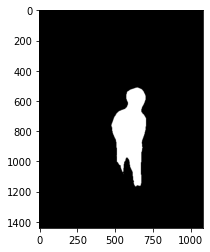

In [35]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

> - 근데 위의 코드에서 `np.all()`할 때 axis가 -1인 점을 주목해야 할 듯하다.  
> - 왜냐하면 seg_color는 RGB 3채널의 값을 뜻하는데, 이 값들이 놓인 축을 기점으로 해야 하니까  
> - 그리고 그 축은 넘파이 어레이에서 (차원:0, 행:1, 열:2)인데 여기서 2에 놓여있다.  
> - 그리고 그 값이 전부 맞으면 2dim shape의 boolean 어레이로 바뀐다.  
> - 그리고 True 값(마스크에 해당하는 값)은 1이니까 이미지로 볼 때 흰색으로 표현되고, False인 0은 검정색으로 보이게 된다.  

> 원본 이미지와 겹쳐 봐서 segmentation이 잘 되었는지 확인해보자

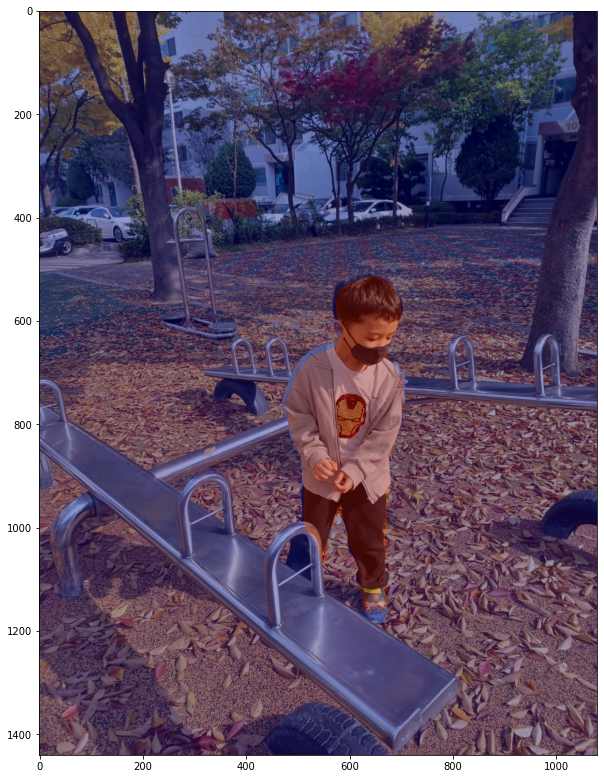

In [44]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(10, 15)) # DJ 추가
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

In [46]:
np.unique(img_mask, return_counts=True)

(array([  0, 255], dtype=uint8), array([1465582,   89618]))

In [49]:
color_mask

array([[[128,   0,   0],
        [128,   0,   0],
        [128,   0,   0],
        ...,
        [128,   0,   0],
        [128,   0,   0],
        [128,   0,   0]],

       [[128,   0,   0],
        [128,   0,   0],
        [128,   0,   0],
        ...,
        [128,   0,   0],
        [128,   0,   0],
        [128,   0,   0]],

       [[128,   0,   0],
        [128,   0,   0],
        [128,   0,   0],
        ...,
        [128,   0,   0],
        [128,   0,   0],
        [128,   0,   0]],

       ...,

       [[128,   0,   0],
        [128,   0,   0],
        [128,   0,   0],
        ...,
        [128,   0,   0],
        [128,   0,   0],
        [128,   0,   0]],

       [[128,   0,   0],
        [128,   0,   0],
        [128,   0,   0],
        ...,
        [128,   0,   0],
        [128,   0,   0],
        [128,   0,   0]],

       [[128,   0,   0],
        [128,   0,   0],
        [128,   0,   0],
        ...,
        [128,   0,   0],
        [128,   0,   0],
        [128,   0,   0]]

In [50]:
color_mask.shape

(1440, 1080, 3)

In [52]:
np.unique(color_mask, return_counts=True)

(array([  0, 128], dtype=uint8), array([3110400, 1555200]))

> - 위에서 (128, 0, 0)값 혹은 (0, 0, 128) 값으로 각각 흰색, 검정색이 바뀌게 한 듯하다.  
> - 주의할 점은 여기서 color_mask의 상태도 RGB가 아닌 BGR  
> - 그리고 그것을 `cv2.addWeighted()`로 원본과 섞다 보니 이든이가 좀 빨갛고, 나머지는 퍼렇다.  
> - BGR2RGB를 `cv2.addWeighted()` 후에 하는데 이유는 섞는 이미지 둘 다 BGR이었기 때문이어서 합치고 바꾸려 한 듯하다.

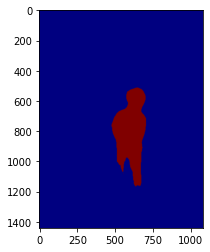

In [53]:
plt.imshow(cv2.cvtColor(color_mask, cv2.COLOR_BGR2RGB))
plt.show()

## 4. 배경 흐리게 하기

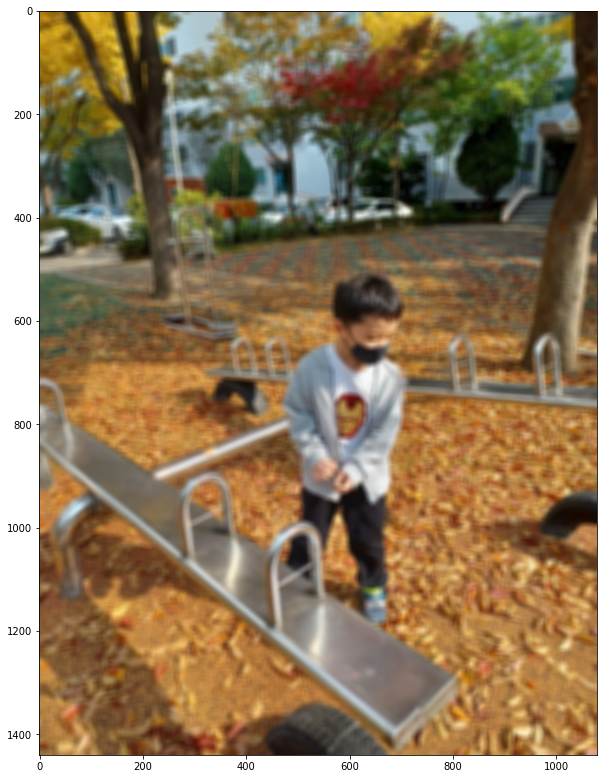

In [55]:
# blur() 함수 이용
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
plt.figure(figsize=(10, 15)) # DJ
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

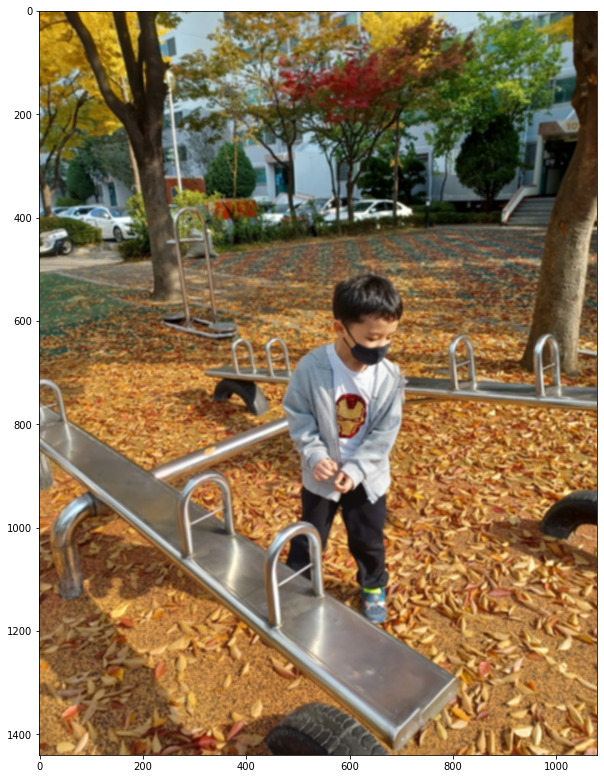

In [56]:
# blur() 함수 이용
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (5,5)) # (5,5)로 변경
plt.figure(figsize=(10, 15)) # DJ
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

> 흐려진 이미지에서 segmentation mask를 이용해 배경만 추출

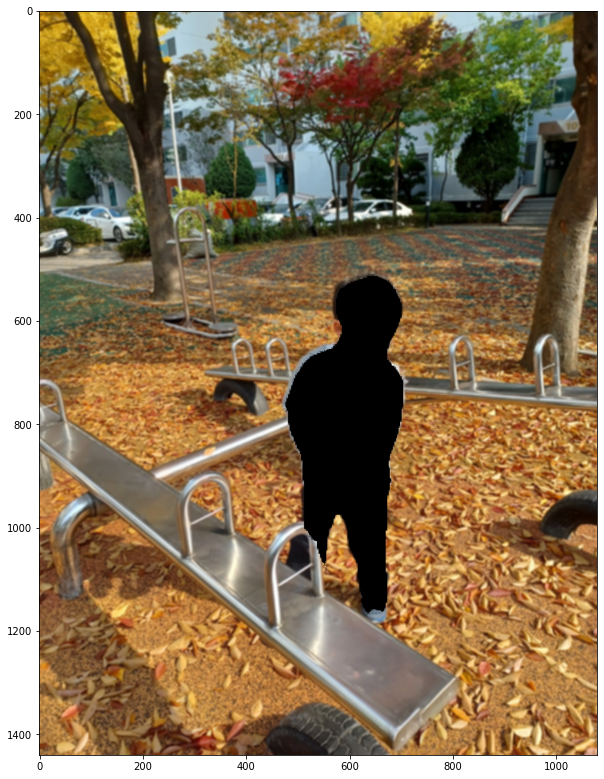

In [57]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10, 15)) # DJ
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

(1440, 1080, 3)


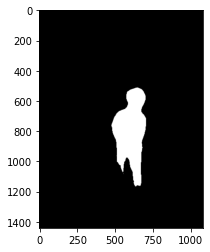

In [61]:
print(img_mask_color.shape)
plt.imshow(img_mask_color)

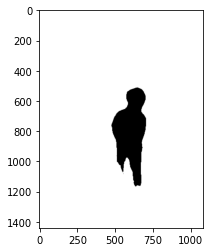

In [62]:
plt.imshow(img_bg_mask)

## 5. 흐린 배경과 원본 영상 합성

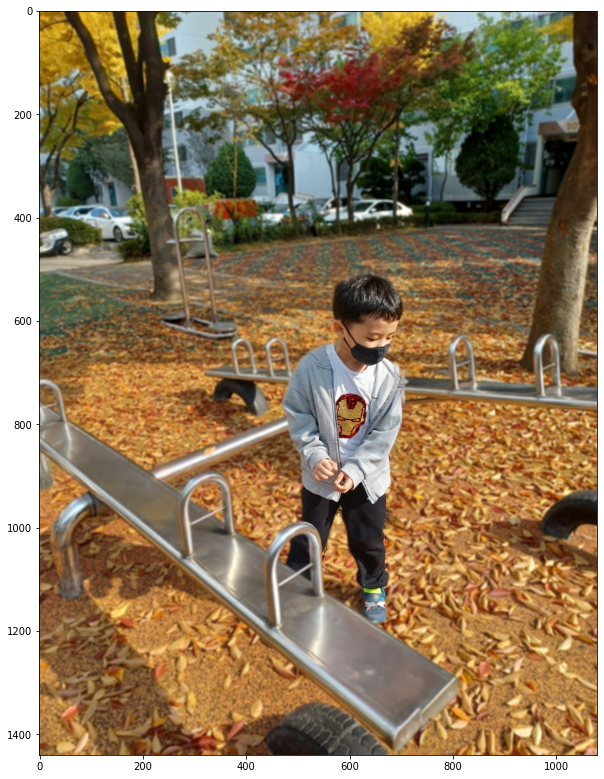

In [63]:
# np.where() 사용해서, 이미지 마스킹 어레이에서 값이 255일 때는 오리지널, 아니면 blurred background 가져오기
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(10, 15)) # DJ
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

In [65]:
# 이미지 저장
cv2.imwrite(os.getenv('HOME')+'/aiffel/human_segmentation/images/edited_eden.png',img_concat)

True

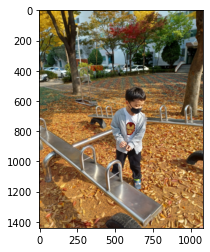

In [110]:
copy = cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB).copy()
plt.imshow(copy)
plt.show()

In [111]:
# annotation 추가
copy = cv2.arrowedLine(copy, (400, 600), (550, 600), (0, 0, 255), thickness=10)

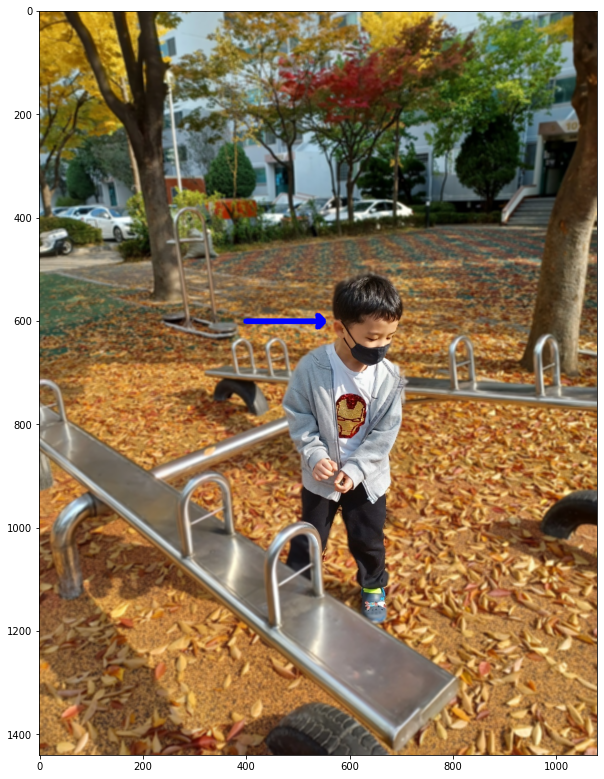

In [112]:
plt.figure(figsize=(10,15))
plt.imshow(copy)
plt.show()

In [113]:
# 텍스트 추가
text1 = 'ear not included'
text1_org = (300, 640)
copy = cv2.putText(copy, text1, text1_org, fontFace=0, fontScale = 1, thickness=3, color = (0,0,255))

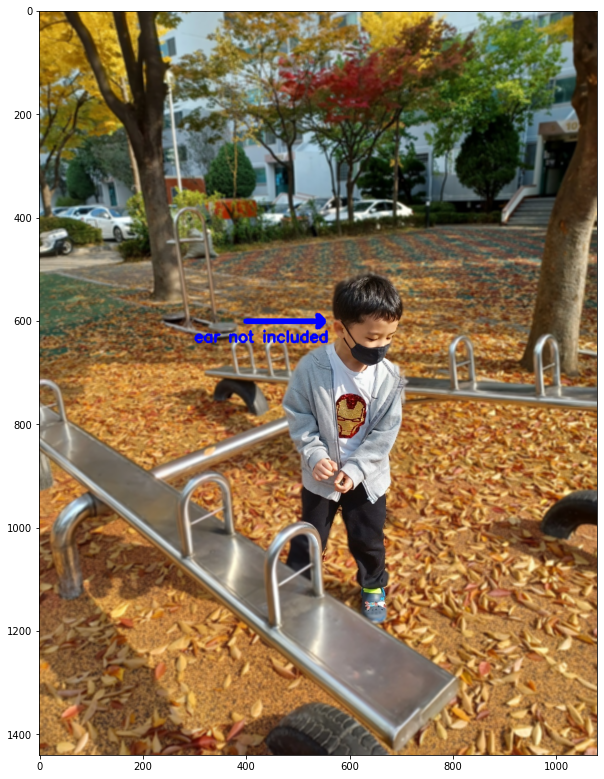

In [114]:
plt.figure(figsize=(10,15))
plt.imshow(copy)
plt.show()

In [115]:
# annotation 추가
copy = cv2.arrowedLine(copy, (300, 1050), (450, 1050), (0, 0, 255), thickness=10)

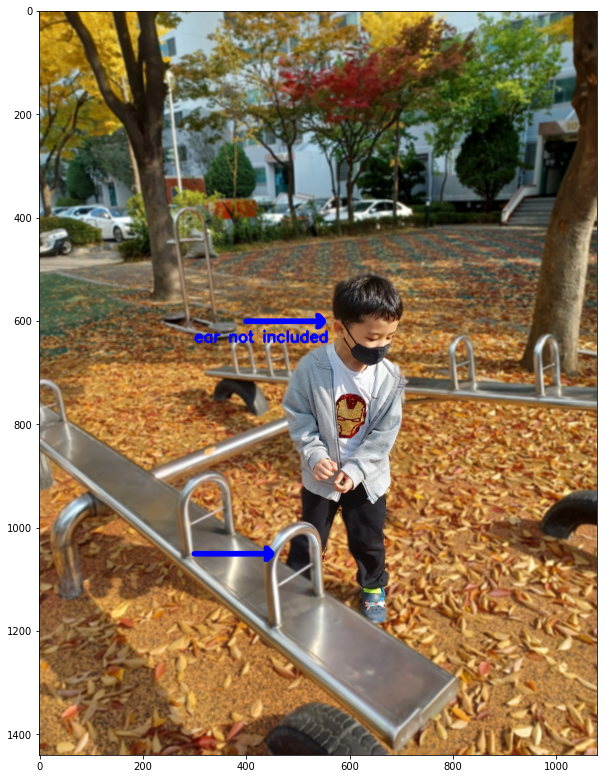

In [116]:
plt.figure(figsize=(10,15))
plt.imshow(copy)
plt.show()

In [117]:
# 텍스트 추가
text2 = 'seesaw cuts out the leg'
text2_org = (180, 1090)
copy = cv2.putText(copy, text2, text2_org, fontFace=0, fontScale = 1, thickness=3, color = (0,0,255))

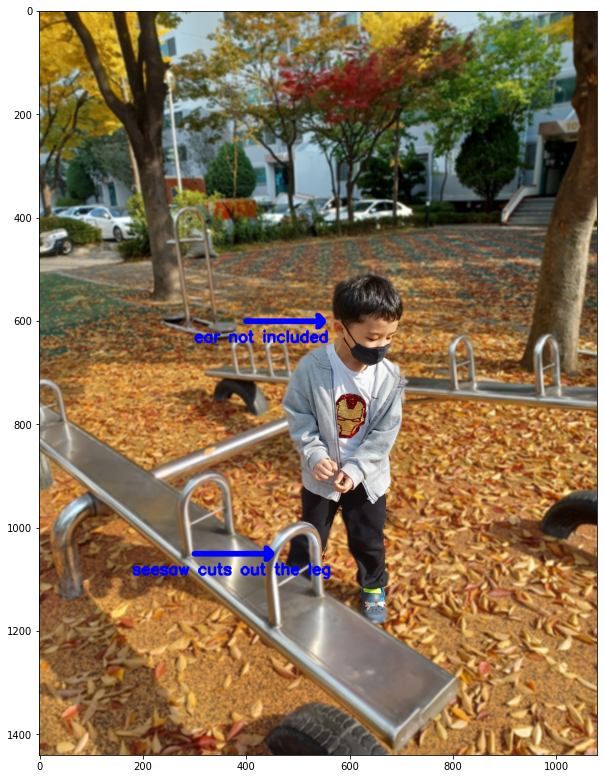

In [118]:
plt.figure(figsize=(10,15))
plt.imshow(copy)
plt.show()

In [120]:
# 이미지 저장
cv2.imwrite(os.getenv('HOME')+'/aiffel/human_segmentation/images/annotated_eden.png',cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

True